<a href="https://colab.research.google.com/github/HanbumKo/DRL-course/blob/main/supplementary/REINFORCE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **REINFORCE**

이번 노트북에서는 Policy Gradient의 기본 알고리즘인 REINFORCE를 CartPole 환경에서 구현해보도록 하겠습니다.

구현에 필요한 라이브러리들을 import 합니다.

In [ ]:
import gym
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Categorical

jupyter notebook에서 matplotlib을 사용하기 위해 필요한 함수도 import합니다.

In [ ]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

# Policy

Policy로 사용할 뉴럴넷 모델입니다. 뉴럴넷으로 구현한 Q Network와의 차이점은, Q network에서는 아웃풋으로 예측한 Q 값인 반면 policy 모델에서는 아웃풋으로 각 action에 대한 확률입니다. 따라서 마지막 레이어에 softmax 레이어를 추가해 확률을 아웃풋으로 내어주도록 합니다.

In [ ]:
class CartpolePolicy(nn.Module):
    def __init__(self, obs_dim, n_actions, device):
        super(CartpolePolicy, self).__init__()

        self.obs_dim = obs_dim
        self.n_actions = n_actions
        self.device = device

        self.l1 = nn.Linear(obs_dim, 64)
        self.l2 = nn.Linear(64, 128)
        self.l3 = nn.Linear(128, n_actions)

    def forward(self, x):
        x = F.relu(self.l1(x))
        x = F.relu(self.l2(x))
        x = self.l3(x)
        x = F.softmax(x, dim=-1)

        return x

    def get_action_logprob(self, obs):
        if isinstance(obs, np.ndarray):
            obs = torch.tensor(obs, dtype=torch.float32)
        obs = obs.to(self.device)
        output = self.forward(obs)
        categorical = Categorical(output)
        action = categorical.sample()
        logprob = categorical.log_prob(action)

        return action.item(), logprob


# Train

에피소드가 종료되고난 후 업데이트 하는 함수입니다. 에피소드를 진행하면서 선택했던 action에 대한 log probability, 그 action에 대한 return을 통해 업데이트를 진행하게 됩니다.

optim.zero_grad()를 통해 optimizer에 등록해두었던 parameter들의 gradient를 0으로 세팅해준 후 .backward()를 해주게 되면 gradient가 계산이 되어 parameter들에 gradient가 저장이 됩니다. -1을 곱하여 gradient ascent를 할 수 있도록 하며, optim.step()전에 .backward()를 여러번 호출하여 gradient를 누적하여 parameter에 저장할 수 있습니다.



In [ ]:
def train(logprobs, returns, optim):
    optim.zero_grad()
    # Cumulate gradients
    for ret, logprob in zip(returns, logprobs):
        j = -1 * logprob * ret
        j.backward()
    optim.step()

# Matplotlib

Matplotlib 라이브러리를 이용해 reward 그래프를 화면에 보여주는 함수입니다.

In [ ]:
def plot(rewards):
    clear_output(True)
    plt.figure(figsize=(20,5))
    # plt.title('')
    plt.ylabel('reward')
    plt.xlabel('episode')
    plt.plot(rewards)
    plt.show()

# Main

트레이닝에 필요한 환경, 모델, optimizer 등등을 정의하는 코드입니다.

In [ ]:
# Save device (cpu or cuda)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Make env
env = gym.make("CartPole-v0")

# shape
obs_shape = env.observation_space.shape
act_shape = tuple([1]) # int to Tuple
obs_dim = obs_shape[0]
n_actions = env.action_space.n
buffer_size = 1000

# Define NN
policy_model = CartpolePolicy(obs_dim=obs_dim, n_actions=n_actions, device=device)
policy_model.to(device)

# Optimizer
optimizer = optim.Adam(policy_model.parameters())

# training parameters
total_step = 60000
batch_size = 32
gamma = 0.99

# list for saving results
rewards = []

# list for saving return & logprobs
logprobs = []
returns = []

트레이닝을 실행하는 메인루프입니다. total_step만큼 돌면서 매 에피소드마다 선택한 action에 대한 log probability, 리워드를 저장합니다. 에피소드가 끝나면 이전 모델들 보다 좋거나 같은 성능을 내면 모델을 저장합니다. 또한 에피소드가 끝나면 저장했던 리워드를 저장했던 list를 거꾸로 돌면서 return(G_t)로 바꾸어 줍니다. 마지막으로 이전에 정의해주었던 train()함수를 호출하여 트레이닝을 진행합니다.

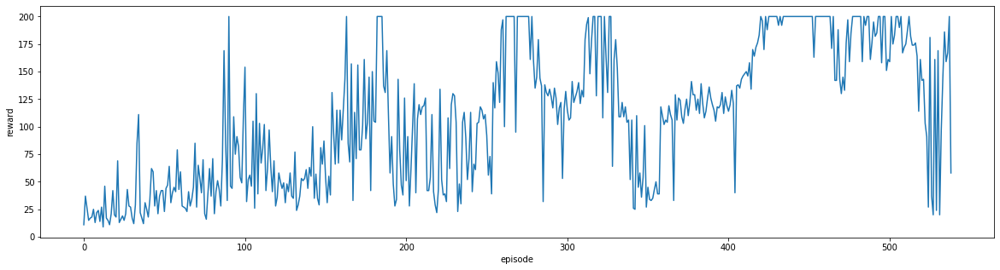

In [ ]:
episode_reward = 0
best_test_reward = -999999
obs = env.reset()
for t in range(total_step):
    action, logprob = policy_model.get_action_logprob(obs)
    next_obs, rew, done, _ = env.step(action)
    logprobs.append(logprob)
    returns.append(rew)
    episode_reward += rew
    obs = next_obs

    if done:
        # Save the best model so far
        if best_test_reward <= episode_reward:
            best_test_reward = episode_reward
            torch.save(policy_model.state_dict(), "policy_model.pt")

        # complete returns
        for i in range(len(returns)-2, -1, -1):
            returns[i] += returns[i+1]*gamma
        rewards.append(episode_reward)
        train(logprobs, returns, optimizer)
        logprobs = []
        returns = []
        obs = env.reset()
        episode_reward = 0
    
    if t % 1000 == 0:
        plot(rewards)

# Render

학습이 잘 진행됐는지 확인해보도록 하겠습니다.

In [ ]:
!apt update
!apt install xvfb
!pip install pyvirtualdisplay
!pip install gym-notebook-wrapper

우선 random하게 action을 선택할 경우의 모습입니다. 중심을 유지하지 못하고 금방 떨어지려고 하는 모습을 확인할 수 있습니다.

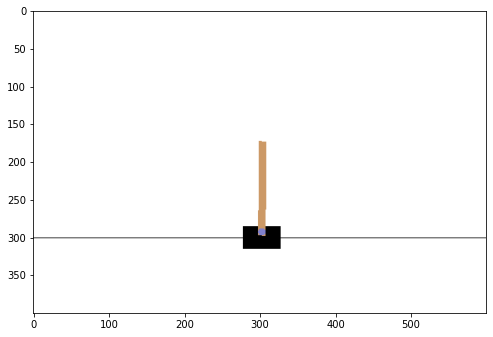

In [ ]:
import gnwrapper
import gym

env = gnwrapper.LoopAnimation(gym.make('CartPole-v0'))

obs = env.reset()
for _ in range(500):
    obs, rew, done, _ = env.step(env.action_space.sample()) # Take random action
    env.render()
    if done:
        obs = env.reset()

env.display()

학습된 policy를 이용해 action을 선택한 경우의 모습입니다. 중심을 잘 잡으려고 하는 모습을 확인할 수 있습니다.

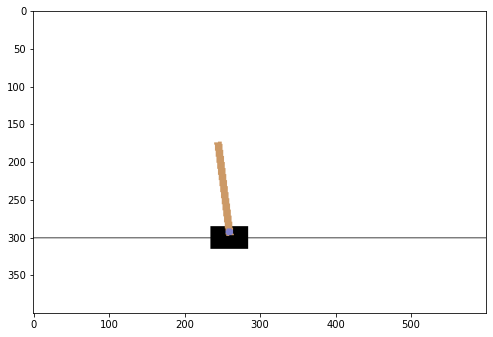

In [ ]:
policy_model.load_state_dict(torch.load("policy_model.pt"))

env = gnwrapper.LoopAnimation(gym.make('CartPole-v0'))

obs = env.reset()

for _ in range(500):
    action, _ = policy_model.get_action_logprob(obs)  # Take action from trained model
    env.render()
    obs, rew, done, _ = env.step(action)
    if done:
        obs = env.reset()

env.display()